In [1]:
%matplotlib inline

import datacube
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from datacube.utils.cog import write_cog
from datacube.utils.geometry import CRS
from dea_tools.dask import create_local_dask_cluster

import sys
sys.path.insert(1, '../Tools/')
from dea_tools.datahandling import load_ard
from dea_tools.plotting import rgb, display_map
from dea_tools.bandindices import calculate_indices

In [2]:
dc = datacube.Datacube(app='DEA_Fractional_Cover')

In [3]:
dc = datacube.Datacube(app="07_Parallel_processing_with_Dask")

In [4]:
#Enable Dask

client = create_local_dask_cluster(return_client=True)

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/akjournalism@gmail.com/proxy/8787/status,
Dashboard: /user/akjournalism@gmail.com/proxy/8787/status,Workers: 1
Total threads: 2,Total memory: 12.21 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:42505,Workers: 1
Dashboard: /user/akjournalism@gmail.com/proxy/8787/status,Total threads: 2
Started: Just now,Total memory: 12.21 GiB
Comm: tcp://127.0.0.1:36451,Total threads: 2
Dashboard: /user/akjournalism@gmail.com/proxy/37555/status,Memory: 12.21 GiB
Nanny: tcp://127.0.0.1:44273,


In [ ]:
# List DEA Fractional Cover products available in DEA
dc_products = dc.list_products()
dc_products.loc[['ga_ls_fc_3']]


In [ ]:
#List FC measurements

dc_measurements = dc.list_measurements()
dc_measurements.loc[['ga_ls_fc_3']]

In [8]:
# Lazy load data SENTINEL

frac_cover = dc.load(product=['ga_ls_fc_3'],
                  measurements=["bs", "pv", "npv", "ue"],
                  x=(149.64, 149.94),
                  y=(-37.2, -37.00),
                  time=('2019-11-11', '2020-01-10'),
                  resolution=(-30, 30),
                  dask_chunks={"time": 1, "x": 2048, "y": 2048})
resampling={
                   "fmask": "nearest",
                   "*": "bilinear"
               },
    
  

# Load DEA Fractional Cover data from the datacube
#fc = dc.load(product='ga_ls_fc_3',
            # measurements=['bs', 'pv', 'npv', 'ue'],
            # output_crs='EPSG:32754',
             #resolution=(-30, 30),
             #group_by='solar_day'
             #)
frac_cover

<xarray.Dataset>
Dimensions:      (time: 20, y: 855, x: 986)
Coordinates:
  * time         (time) datetime64[ns] 2019-11-13T23:51:02.964912 ... 2020-01...
  * y            (y) float64 -4.153e+06 -4.153e+06 ... -4.178e+06 -4.178e+06
  * x            (x) float64 1.567e+06 1.567e+06 ... 1.597e+06 1.597e+06
    spatial_ref  int32 3577
Data variables:
    bs           (time, y, x) uint8 dask.array<chunksize=(1, 855, 986), meta=np.ndarray>
    pv           (time, y, x) uint8 dask.array<chunksize=(1, 855, 986), meta=np.ndarray>
    npv          (time, y, x) uint8 dask.array<chunksize=(1, 855, 986), meta=np.ndarray>
    ue           (time, y, x) uint8 dask.array<chunksize=(1, 855, 986), meta=np.ndarray>
Attributes:
    crs:           EPSG:3577
    grid_mapping:  spatial_ref

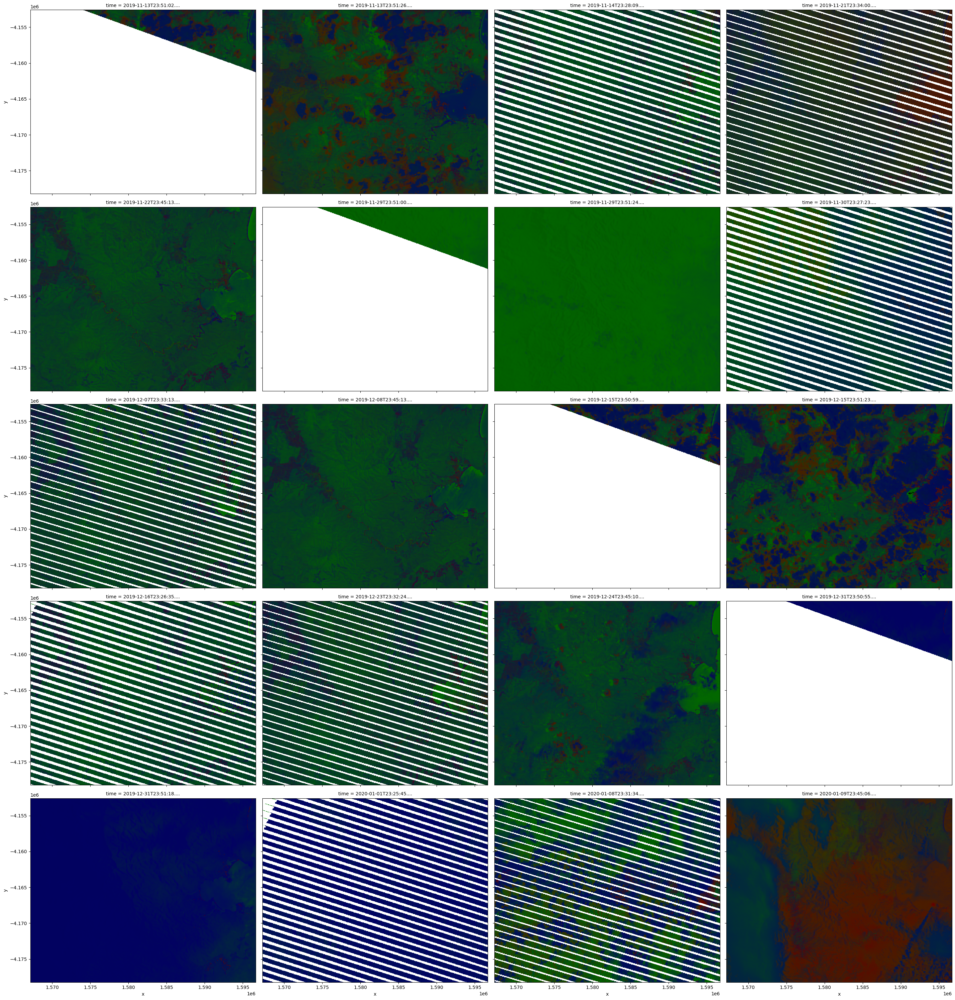

In [11]:
# Plot DEA Fractional Cover data as a false colour RGB image
rgb(frac_cover, bands=['bs', 'pv', 'npv'], col='time')

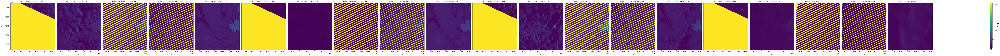

In [13]:
# Plot unmixing error using `robust=True` to drop outliers and improve contrast
frac_cover.ue.plot(col='time', robust=True, size=5)

In [14]:
# Replace all nodata values with `NaN`
fc = masking.mask_invalid_data(fc)

NameError: name 'masking' is not defined

In [15]:
# Load DEA Water Observations data from the datacube
wo = dc.load(product='ga_ls_wo_3',
             group_by='solar_day',
             fuse_func=wofs_fuser,
             like=frac_cover)

# Plot the loaded water observations
plot_wo(wo.water, col='time', size=5)

NameError: name 'wofs_fuser' is not defined

In [ ]:
# Keeping only dry, non-cloudy pixels
wo_mask = masking.make_mask(wo.water, dry=True)
wo_mask.plot(col='time', size=5)

In [ ]:
# Set any unclear or wet pixel to `NaN`
fc_masked = fc.where(wo_mask)

# Plot the masked fractional cover data
rgb(fc_masked, bands=['bs', 'pv', 'npv'], col='time')

In [ ]:
# Calculate the percent of nodata pixels in each observation
percent_nodata = fc_masked.pv.isnull().mean(dim=['x', 'y'])

# Use this to filter to observations with less than 50% nodata
fc_masked = fc_masked.sel(time=percent_nodata < 0.5)

# The data now contains only three observations
fc_masked

In [ ]:
# Calculate average fractional cover for `bs`, `pv` and `npv` over time
fc_through_time = fc_masked[['pv', 'npv', 'bs']].mean(dim=['x', 'y'])

# Plot the changing proportions as a line graph
fc_through_time.to_array().plot.line(hue='variable', size=5)
plt.title('Fractional cover over time')
plt.ylabel('Percent cover (%)');